In [13]:
import tensorflow as tf
import numpy as np
import pandas as pd 
from PIL import Image
import cv2
from pathlib import Path
import matplotlib.pyplot as plt
from tensorflow.keras import layers, models

In [14]:
dataset3path = Path("../dataset/woundDataset3")


In [15]:
image_path = sorted(dataset3path.glob("*.jpg"))

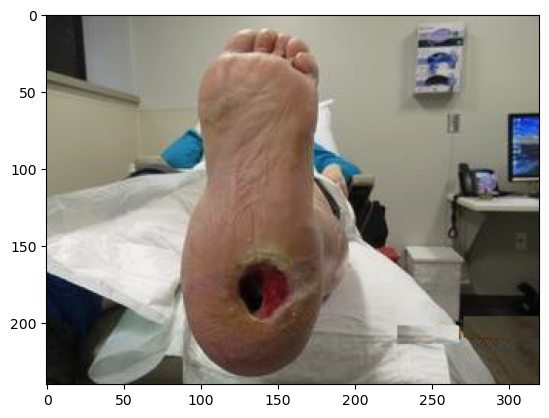

In [16]:
image = Image.open(image_path[3])
plt.Figure(figsize=(5,5))
plt.imshow(image)


In [17]:
len(image_path)

1000

In [18]:
image.size

(320, 240)

In [19]:
image = cv2.imread(image_path[3])
image_rgb = cv2.cvtColor(
    image, cv2.COLOR_BGR2RGB
)
image_hsv = cv2.cvtColor(
    image, cv2.COLOR_BGR2HSV
)
H, S, V = cv2.split(image_hsv)

print("Hue:", H.min(), H.max())
print("Saturation:", S.min(), S.max())
print("Value:", V.min(), V.max())



Hue: 0 179
Saturation: 0 255
Value: 0 255


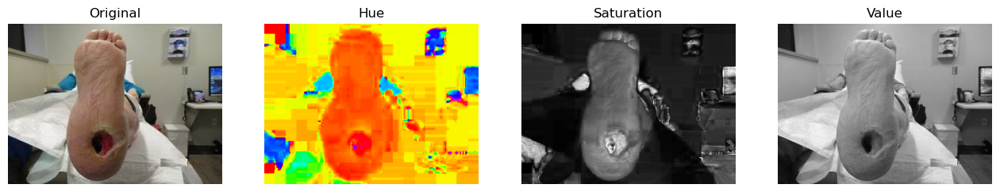

In [20]:
plt.figure(figsize=(16, 5))

plt.subplot(1, 4, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(H, cmap="hsv")
plt.title("Hue")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(S, cmap="gray")
plt.title("Saturation")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(V, cmap="gray")
plt.title("Value")
plt.axis("off")

plt.show()

In [21]:
mask = (
    (S > 80) & (V > 180)
).astype(np.uint8) * 255

In [22]:
kernel  = np.ones((5,5), np.uint)
mask = cv2.morphologyEx(
    mask,
    cv2.MORPH_OPEN,
    kernel
)
mask = cv2.morphologyEx(
    mask,
    cv2.MORPH_CLOSE,
    kernel
)

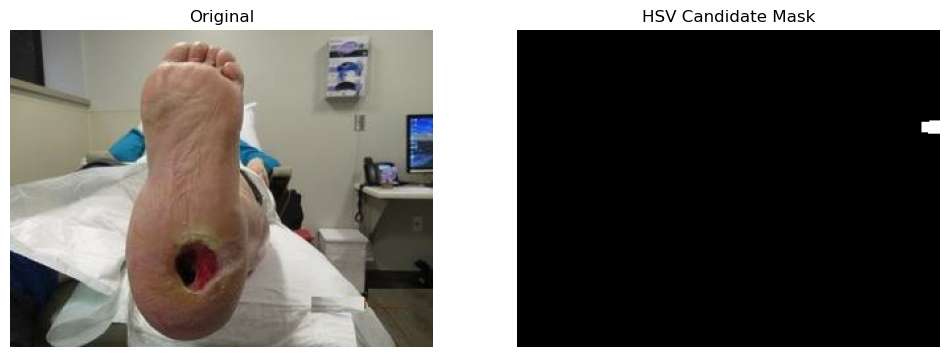

In [23]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("HSV Candidate Mask")
plt.axis("off")

plt.show()

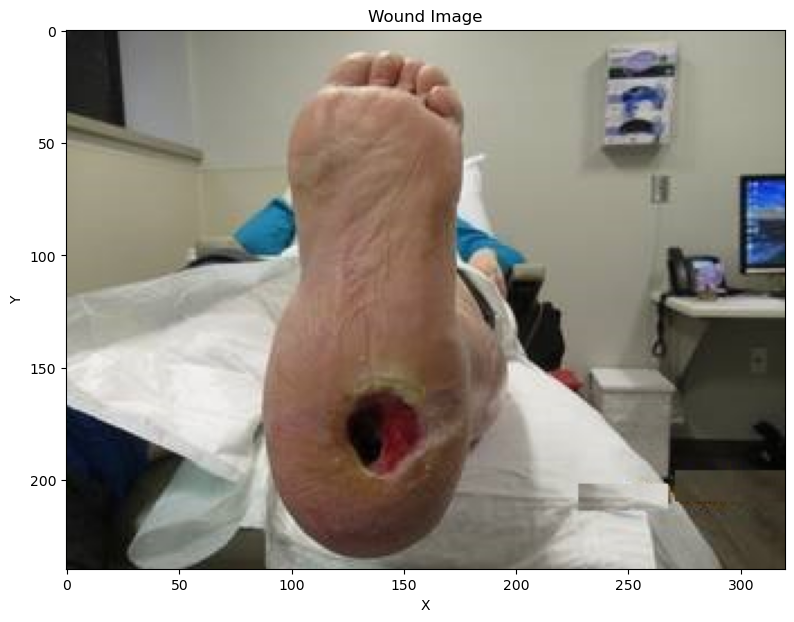

In [24]:
plt.figure(figsize=(10, 7))

plt.imshow(image_rgb)
plt.title("Wound Image")
plt.xlabel("X")
plt.ylabel("Y")

plt.show()

In [25]:
x1, y1 = 130, 145
x2, y2 = 180, 210

wound_region = image_hsv[
    y1:y2,
    x1:x2
]

H_wound = wound_region[:, :, 0]
S_wound = wound_region[:, :, 1]
V_wound = wound_region[:, :, 2]

print("Wound region HSV")
print("----------------")

print(
    "H:",
    H_wound.min(),
    "to",
    H_wound.max()
)

print(
    "S:",
    S_wound.min(),
    "to",
    S_wound.max()
)

print(
    "V:",
    V_wound.min(),
    "to",
    V_wound.max()
)

Wound region HSV
----------------
H: 0 to 179
S: 25 to 255
V: 3 to 156


In [26]:
print(image_rgb.shape)

(240, 320, 3)


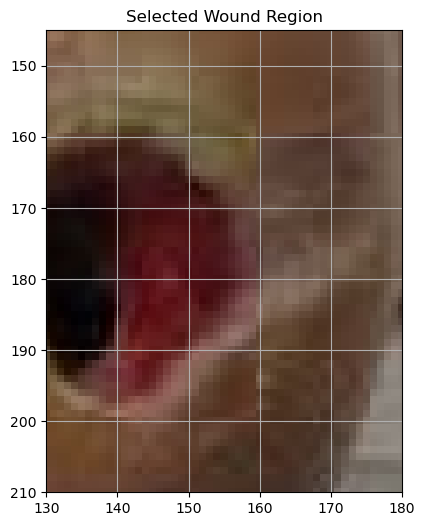

In [27]:
plt.figure(figsize=(8, 6))

plt.imshow(image_rgb)

plt.xlim(x1, x2)
plt.ylim(y2, y1)

plt.grid()

plt.title("Selected Wound Region")

plt.show()

In [28]:
print("Wound region HSV")
print("----------------")

print("H:", H_wound.min(), "to", H_wound.max())
print("S:", S_wound.min(), "to", S_wound.max())
print("V:", V_wound.min(), "to", V_wound.max())

Wound region HSV
----------------
H: 0 to 179
S: 25 to 255
V: 3 to 156


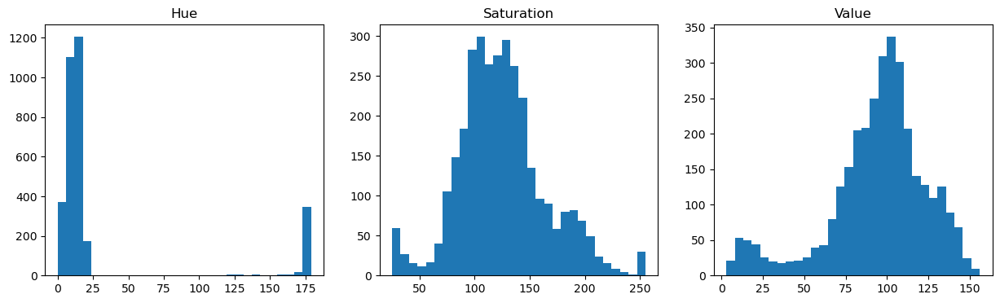

In [29]:
plt.figure(figsize=(15, 4))

plt.subplot(1, 3, 1)
plt.hist(H_wound.ravel(), bins=30)
plt.title("Hue")

plt.subplot(1, 3, 2)
plt.hist(S_wound.ravel(), bins=30)
plt.title("Saturation")

plt.subplot(1, 3, 3)
plt.hist(V_wound.ravel(), bins=30)
plt.title("Value")

plt.show()

In [30]:
x1s, y1s = 155, 150
x2s, y2s = 200, 200

skin_region = image_hsv[
    y1s:y2s,
    x1s:x2s
]

H_skin = skin_region[:, :, 0]
S_skin = skin_region[:, :, 1]
V_skin = skin_region[:, :, 2]

print("Normal skin HSV")
print("----------------")

print("H:", H_skin.min(), "to", H_skin.max())
print("S:", S_skin.min(), "to", S_skin.max())
print("V:", V_skin.min(), "to", V_skin.max())

Normal skin HSV
----------------
H: 0 to 179
S: 9 to 185
V: 65 to 249


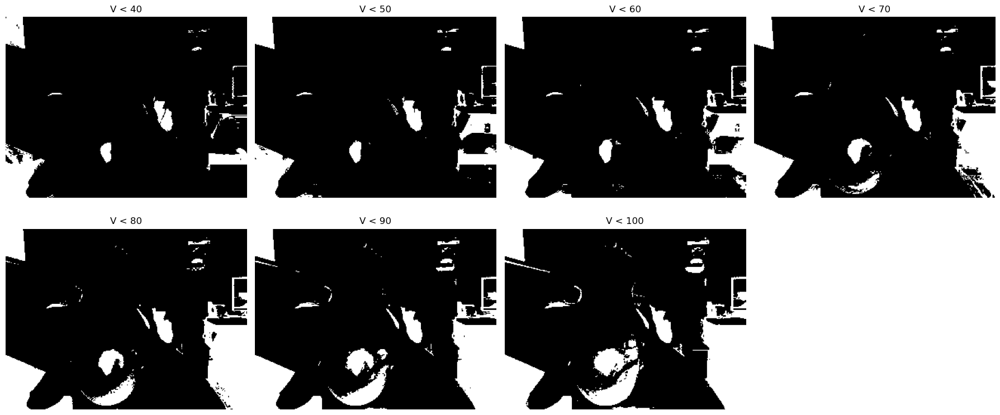

In [31]:
thresholds = [40, 50, 60, 70, 80, 90, 100]

plt.figure(figsize=(18, 8))

for i, threshold in enumerate(thresholds):

    test_mask = (
        V < threshold
    ).astype(np.uint8) * 255

    plt.subplot(2, 4, i + 1)

    plt.imshow(test_mask, cmap="gray")

    plt.title(f"V < {threshold}")

    plt.axis("off")

plt.tight_layout()
plt.show()

In [32]:
image_lab = cv2.cvtColor(
    image_rgb,
    cv2.COLOR_RGB2LAB
)

L, A, B = cv2.split(image_lab)

print("L:", L.min(), L.max())
print("A:", A.min(), A.max())
print("B:", B.min(), B.max())

L: 0 246
A: 113 175
B: 51 156


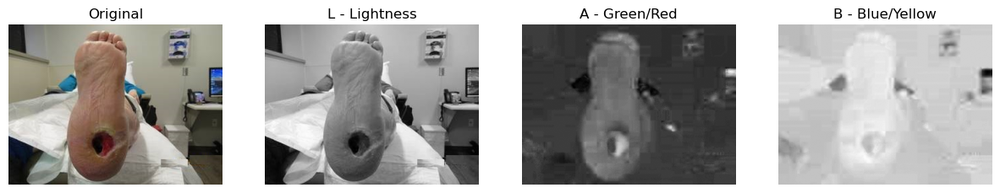

In [33]:
plt.figure(figsize=(15, 4))

plt.subplot(1, 4, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 4, 2)
plt.imshow(L, cmap="gray")
plt.title("L - Lightness")
plt.axis("off")

plt.subplot(1, 4, 3)
plt.imshow(A, cmap="gray")
plt.title("A - Green/Red")
plt.axis("off")

plt.subplot(1, 4, 4)
plt.imshow(B, cmap="gray")
plt.title("B - Blue/Yellow")
plt.axis("off")

plt.show()

In [34]:
x1, y1 = 130, 145
x2, y2 = 180, 210

wound_lab = image_lab[y1:y2, x1:x2]

L_wound = wound_lab[:, :, 0]
A_wound = wound_lab[:, :, 1]
B_wound = wound_lab[:, :, 2]

print("Wound LAB")
print("---------")

print("L:", L_wound.min(), "to", L_wound.max())
print("A:", A_wound.min(), "to", A_wound.max())
print("B:", B_wound.min(), "to", B_wound.max())

Wound LAB
---------
L: 0 to 153
A: 127 to 163
B: 126 to 155


In [35]:
x1s, y1s = 155, 150
x2s, y2s = 200, 200

skin_lab = image_lab[y1s:y2s, x1s:x2s]

L_skin = skin_lab[:, :, 0]
A_skin = skin_lab[:, :, 1]
B_skin = skin_lab[:, :, 2]

In [36]:
print("Normal Skin LAB")
print("----------------")

print("L:", L_skin.min(), "to", L_skin.max())
print("A:", A_skin.min(), "to", A_skin.max())
print("B:", B_skin.min(), "to", B_skin.max())

Normal Skin LAB
----------------
L: 36 to 243
A: 127 to 153
B: 129 to 155


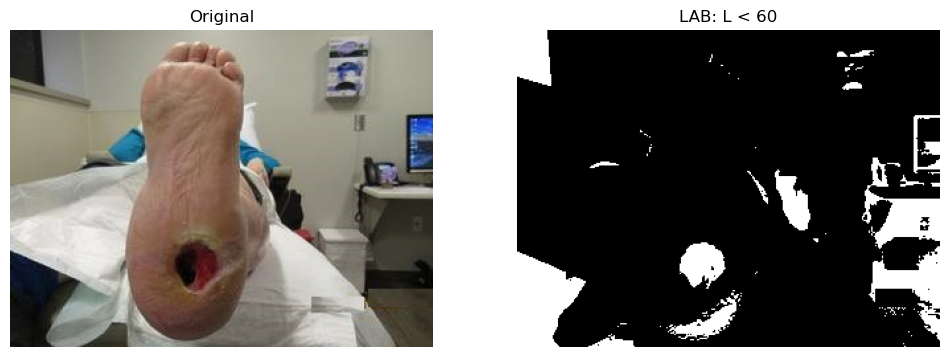

In [37]:
mask = (
    L < 60
).astype(np.uint8) * 255

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("LAB: L < 60")
plt.axis("off")

plt.show()

In [38]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread(
    str(image_path)
)

image_rgb = cv2.cvtColor(
    image,
    cv2.COLOR_BGR2RGB
)

print("Shape:", image_rgb.shape)

plt.figure(figsize=(8, 6))
plt.imshow(image_rgb)
plt.title(image_path.name)
plt.axis("on")
plt.show()

[ WARN:0@53.748] global loadsave.cpp:278 findDecoder imread_('[PosixPath('../dataset/woundDataset3/0.jpg'), PosixPath('../dataset/woundDataset3/1.jpg'), PosixPath('../dataset/woundDataset3/10.jpg'), PosixPath('../dataset/woundDataset3/100.jpg'), PosixPath('../dataset/woundDataset3/101.jpg'), PosixPath('../dataset/woundDataset3/102.jpg'), PosixPath('../dataset/woundDataset3/103.jpg'), PosixPath('../dataset/woundDataset3/104.jpg'), PosixPath('../dataset/woundDataset3/105.jpg'), PosixPath('../dataset/woundDataset3/106.jpg'), PosixPath('../dataset/woundDataset3/107.jpg'), PosixPath('../dataset/woundDataset3/108.jpg'), PosixPath('../dataset/woundDataset3/109.jpg'), PosixPath('../dataset/woundDataset3/11.jpg'), PosixPath('../dataset/woundDataset3/110.jpg'), PosixPath('../dataset/woundDataset3/111.jpg'), PosixPath('../dataset/woundDataset3/112.jpg'), PosixPath('../dataset/woundDataset3/113.jpg'), PosixPath('../dataset/woundDataset3/114.jpg'), PosixPath('../dataset/woundDataset3/115.jpg'), Pos

error: OpenCV(5.0.0) /io/opencv/modules/imgproc/src/color.cpp:199: error: (-215:Assertion failed) !_src.empty() in function 'cvtColor'


In [41]:
image_path = image_path[0]

print("image_path:", image_path)
print("exists:", image_path.exists())

image_path: ../dataset/woundDataset3/0.jpg
exists: True


Loaded: True
Shape: (240, 320, 3)


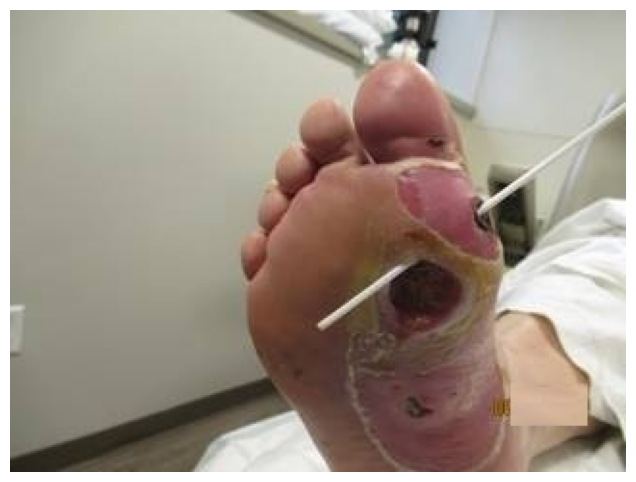

In [42]:
import cv2
import matplotlib.pyplot as plt

image = cv2.imread(str(image_path))

print("Loaded:", image is not None)

image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

print("Shape:", image_rgb.shape)

plt.figure(figsize=(8, 6))
plt.imshow(image_rgb)
plt.axis("off")
plt.show()

In [43]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)
lab = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2LAB)

H, S, V = cv2.split(hsv)
L, A, B = cv2.split(lab)

print("HSV:", hsv.shape)
print("LAB:", lab.shape)

HSV: (240, 320, 3)
LAB: (240, 320, 3)


In [44]:
R = image_rgb[:, :, 0].astype(np.int16)
G = image_rgb[:, :, 1].astype(np.int16)
B_rgb = image_rgb[:, :, 2].astype(np.int16)

redness = R - ((G + B_rgb) // 2)

candidate = (
    ((L < 100) & (S > 30)) |
    ((redness > 20) & (L < 180))
)

mask = (candidate.astype(np.uint8)) * 255

print("Foreground pixels:", np.sum(mask > 0))

Foreground pixels: 26877


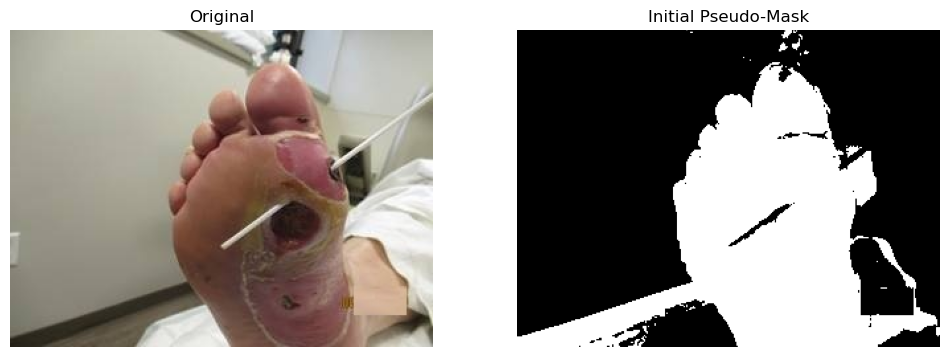

In [45]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask, cmap="gray")
plt.title("Initial Pseudo-Mask")
plt.axis("off")

plt.show()

In [46]:
R = image_rgb[:, :, 0].astype(np.int16)
G = image_rgb[:, :, 1].astype(np.int16)
B_rgb = image_rgb[:, :, 2].astype(np.int16)

# Red/purple wound tendency
red_score = R - G
purple_score = B_rgb - G

# Combine color differences
wound_score = red_score + 0.5 * purple_score

print(
    "Score range:",
    wound_score.min(),
    "to",
    wound_score.max()
)

Score range: -21.5 to 82.5


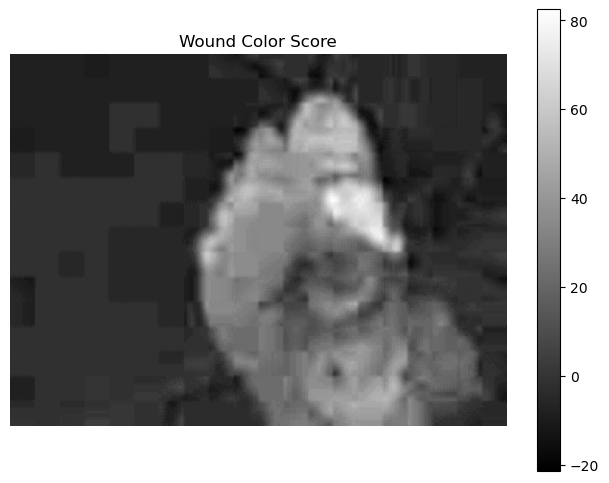

In [47]:
plt.figure(figsize=(8, 6))
plt.imshow(wound_score, cmap="gray")
plt.title("Wound Color Score")
plt.colorbar()
plt.axis("off")
plt.show()

In [48]:
threshold = np.percentile(wound_score, 90)

mask_color = (wound_score > threshold).astype(np.uint8) * 255

print("Threshold:", threshold)
print("Foreground pixels:", np.sum(mask_color > 0))

Threshold: 36.5
Foreground pixels: 7574


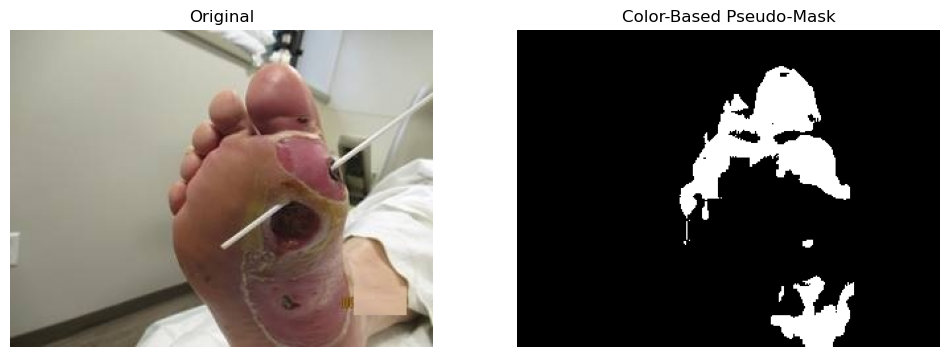

In [49]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(mask_color, cmap="gray")
plt.title("Color-Based Pseudo-Mask")
plt.axis("off")

plt.show()

In [50]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

image_bgr = cv2.imread(str(image_path))

h, w = image_bgr.shape[:2]

# Start with everything as probable background
grab_mask = np.zeros((h, w), np.uint8)

# Leave a border as background
grab_mask[10:h-10, 10:w-10] = cv2.GC_PR_FGD

# Initialize GrabCut
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

cv2.grabCut(
    image_bgr,
    grab_mask,
    None,
    bgd_model,
    fgd_model,
    5,
    cv2.GC_INIT_WITH_MASK
)

# Convert GrabCut result to binary
foot_mask = np.where(
    (grab_mask == cv2.GC_FGD) | (grab_mask == cv2.GC_PR_FGD),
    255,
    0
).astype(np.uint8)

print("Foreground pixels:", np.sum(foot_mask > 0))

Foreground pixels: 23710


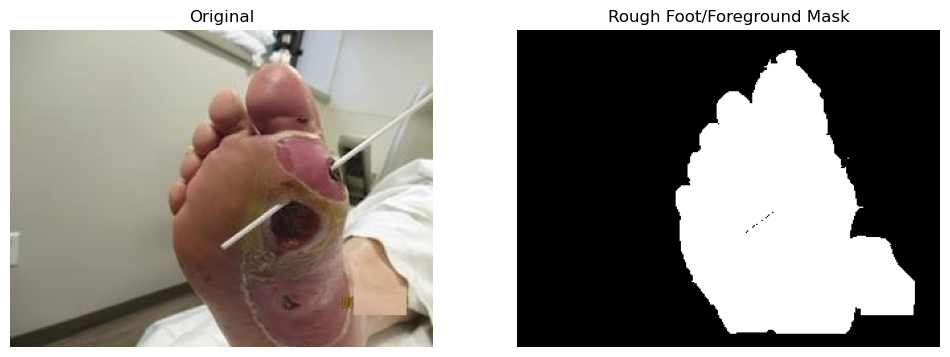

In [51]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(foot_mask, cmap="gray")
plt.title("Rough Foot/Foreground Mask")
plt.axis("off")

plt.show()

In [52]:
# Get LAB pixels only from the rough foot region
pixels = lab[foot_mask > 0]

# Convert to float32 for K-means
pixels_float = np.float32(pixels)

# Number of color clusters
K = 5

criteria = (
    cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
    100,
    0.2
)

_, labels, centers = cv2.kmeans(
    pixels_float,
    K,
    None,
    criteria,
    10,
    cv2.KMEANS_PP_CENTERS
)

centers = np.uint8(centers)

print("Cluster centers (L, A, B):")
for i, center in enumerate(centers):
    count = np.sum(labels.flatten() == i)
    print(f"Cluster {i}: {center} | pixels: {count}")

Cluster centers (L, A, B):
Cluster 0: [105 143 142] | pixels: 6247
Cluster 1: [190 135 143] | pixels: 3124
Cluster 2: [ 76 141 140] | pixels: 8463
Cluster 3: [139 143 142] | pixels: 4261
Cluster 4: [ 41 140 136] | pixels: 1615


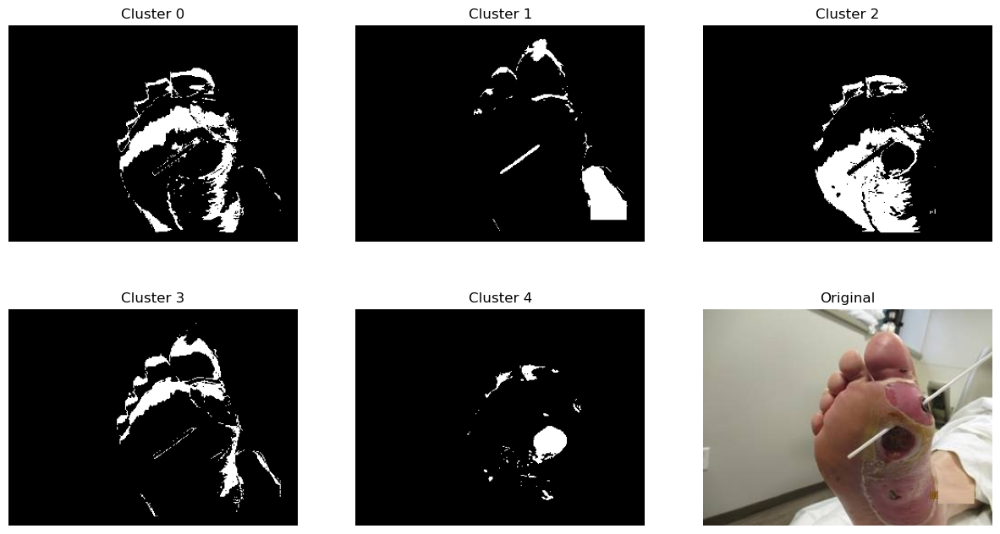

In [53]:
cluster_map = np.full((h, w), -1, dtype=np.int32)

cluster_map[foot_mask > 0] = labels.flatten()

plt.figure(figsize=(15, 8))

for i in range(K):
    cluster_image = np.zeros((h, w), dtype=np.uint8)
    cluster_image[cluster_map == i] = 255

    plt.subplot(2, 3, i + 1)
    plt.imshow(cluster_image, cmap="gray")
    plt.title(f"Cluster {i}")
    plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.show()

In [54]:
for i, center in enumerate(centers):
    print(
        f"Cluster {i}: "
        f"L={center[0]}, "
        f"A={center[1]}, "
        f"B={center[2]}"
    )

Cluster 0: L=105, A=143, B=142
Cluster 1: L=190, A=135, B=143
Cluster 2: L=76, A=141, B=140
Cluster 3: L=139, A=143, B=142
Cluster 4: L=41, A=140, B=136


In [55]:
cluster_scores = []

for i, center in enumerate(centers):
    L_val, A_val, B_val = center

    # Higher score = darker + more reddish
    score = (255 - L_val) + 2 * (A_val - 127)

    cluster_scores.append(score)

    print(
        f"Cluster {i}: "
        f"L={L_val}, A={A_val}, B={B_val}, "
        f"Score={score:.2f}"
    )

Cluster 0: L=105, A=143, B=142, Score=182.00
Cluster 1: L=190, A=135, B=143, Score=81.00
Cluster 2: L=76, A=141, B=140, Score=207.00
Cluster 3: L=139, A=143, B=142, Score=148.00
Cluster 4: L=41, A=140, B=136, Score=240.00


Selected cluster: 4


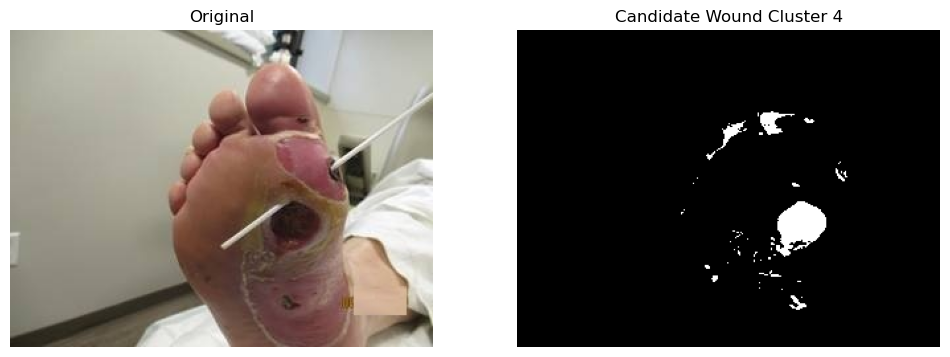

In [56]:
best_cluster = np.argmax(cluster_scores)

print("Selected cluster:", best_cluster)

wound_candidate = np.zeros((h, w), dtype=np.uint8)
wound_candidate[cluster_map == best_cluster] = 255

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(wound_candidate, cmap="gray")
plt.title(f"Candidate Wound Cluster {best_cluster}")
plt.axis("off")

plt.show()

In [57]:
# LAB channels
L_float = L.astype(np.float32)

# Smooth brightness to represent the local surrounding brightness
local_L = cv2.GaussianBlur(L_float, (31, 31), 0)

# How much darker is each pixel than its surroundings?
darkness = local_L - L_float

# Redness relative to green
R = image_rgb[:, :, 0].astype(np.float32)
G = image_rgb[:, :, 1].astype(np.float32)

redness = R - G

# Only consider pixels inside the rough foot region
dark_values = darkness[foot_mask > 0]
red_values = redness[foot_mask > 0]

dark_threshold = np.percentile(dark_values, 90)
red_threshold = np.percentile(red_values, 80)

print("Darkness threshold:", dark_threshold)
print("Redness threshold:", red_threshold)

Darkness threshold: 17.349824523925808
Redness threshold: 47.0


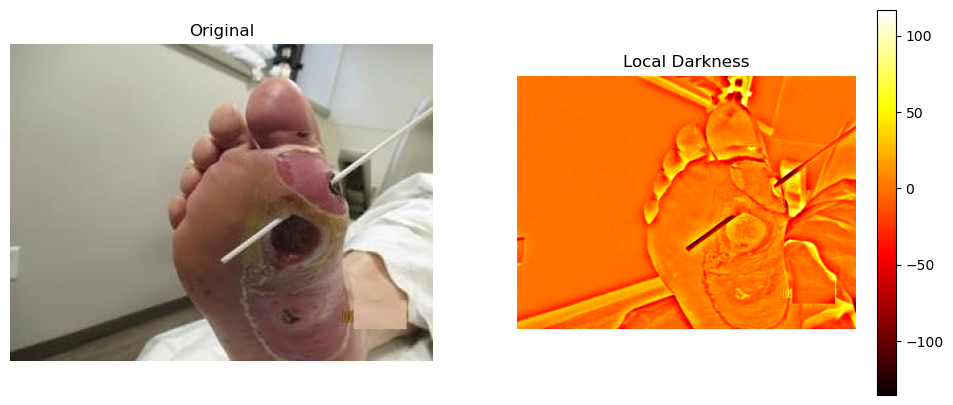

In [58]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(darkness, cmap="hot")
plt.title("Local Darkness")
plt.colorbar()
plt.axis("off")

plt.show()

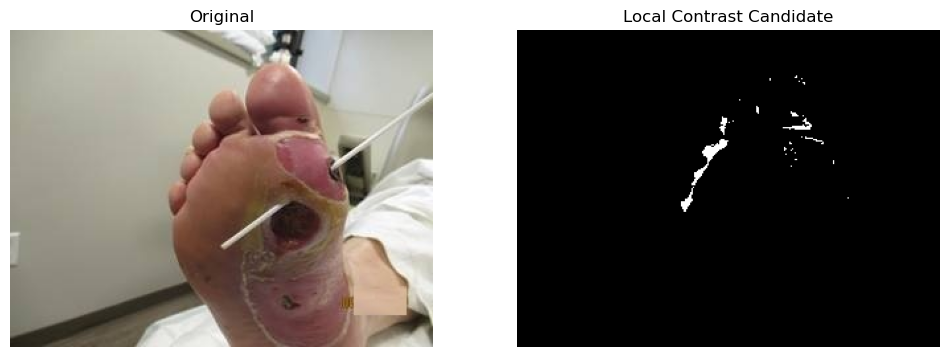

In [59]:
candidate = (
    (darkness > dark_threshold) &
    (redness > red_threshold) &
    (foot_mask > 0)
)

local_mask = candidate.astype(np.uint8) * 255

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(local_mask, cmap="gray")
plt.title("Local Contrast Candidate")
plt.axis("off")

plt.show()

Dark threshold: 52.0
Seed pixels: 1152


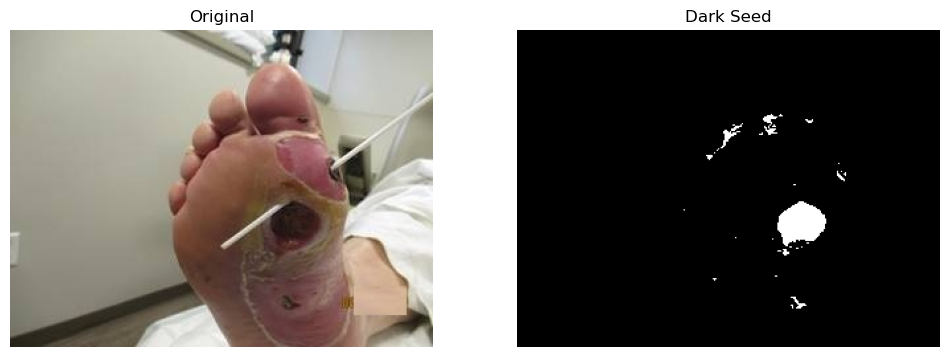

In [60]:
# Use LAB brightness
L_float = L.astype(np.float32)

# Only look inside the foot
foot_L = L_float[foot_mask > 0]

# Very dark pixels
dark_threshold = np.percentile(foot_L, 5)

seed = (
    (L_float < dark_threshold) &
    (foot_mask > 0)
).astype(np.uint8) * 255

print("Dark threshold:", dark_threshold)
print("Seed pixels:", np.sum(seed > 0))

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(seed, cmap="gray")
plt.title("Dark Seed")
plt.axis("off")

plt.show()

In [61]:
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(
    seed,
    connectivity=8
)

# Print components sorted by area
components = []

for i in range(1, num_labels):
    area = stats[i, cv2.CC_STAT_AREA]
    components.append((i, area, centroids[i]))

components.sort(key=lambda x: x[1], reverse=True)

for i, area, centroid in components[:10]:
    print(
        f"Label: {i}, "
        f"Area: {area}, "
        f"Centroid: {centroid}"
    )

Label: 15, Area: 859, Centroid: [214.4644936  146.16880093]
Label: 4, Area: 81, Centroid: [160.7037037   79.07407407]
Label: 1, Area: 75, Centroid: [190.76  71.12]
Label: 27, Area: 33, Centroid: [212.54545455 206.51515152]
Label: 11, Area: 17, Centroid: [244.11764706 110.88235294]
Label: 24, Area: 17, Centroid: [202.70588235 168.05882353]
Label: 9, Area: 13, Centroid: [145.15384615  96.        ]
Label: 3, Area: 11, Centroid: [220.72727273  69.        ]
Label: 2, Area: 4, Centroid: [199.    64.75]
Label: 5, Area: 4, Centroid: [194.    72.75]


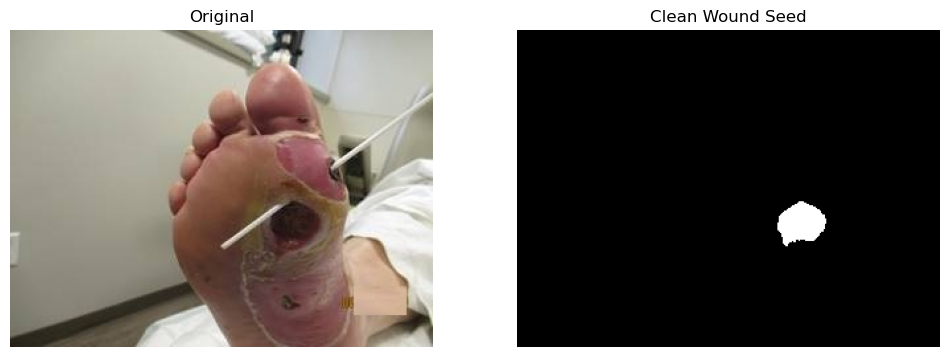

In [62]:
largest_label = components[0][0]

seed_clean = np.zeros_like(seed)

seed_clean[labels == largest_label] = 255

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(seed_clean, cmap="gray")
plt.title("Clean Wound Seed")
plt.axis("off")

plt.show()

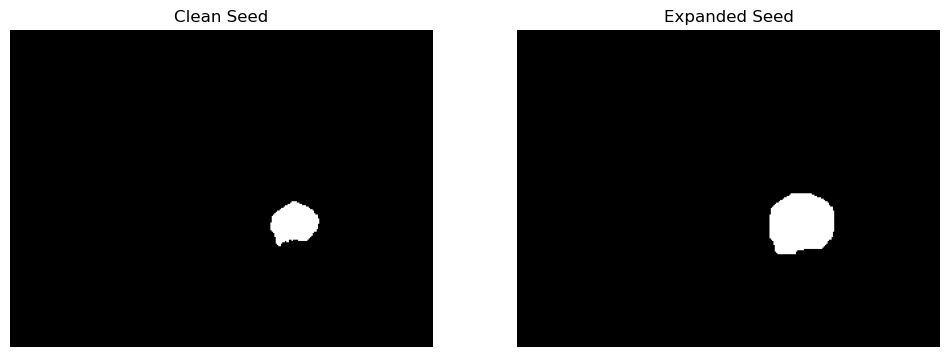

In [63]:
kernel = np.ones((5, 5), np.uint8)

seed_expanded = cv2.dilate(
    seed_clean,
    kernel,
    iterations=3
)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(seed_clean, cmap="gray")
plt.title("Clean Seed")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(seed_expanded, cmap="gray")
plt.title("Expanded Seed")
plt.axis("off")

plt.show()

In [64]:
# Start with everything as background
gc_mask = np.full((h, w), cv2.GC_BGD, dtype=np.uint8)

# Foot region = probable foreground
gc_mask[foot_mask > 0] = cv2.GC_PR_FGD

# Our dark wound seed = definite foreground
gc_mask[seed_clean > 0] = cv2.GC_FGD

# Models required by GrabCut
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

# Run GrabCut
cv2.grabCut(
    image_bgr,
    gc_mask,
    None,
    bgd_model,
    fgd_model,
    5,
    cv2.GC_INIT_WITH_MASK
)

# Final wound candidate
wound_mask = np.where(
    (gc_mask == cv2.GC_FGD) |
    (gc_mask == cv2.GC_PR_FGD),
    255,
    0
).astype(np.uint8)

print("Wound pixels:", np.sum(wound_mask > 0))

Wound pixels: 23303


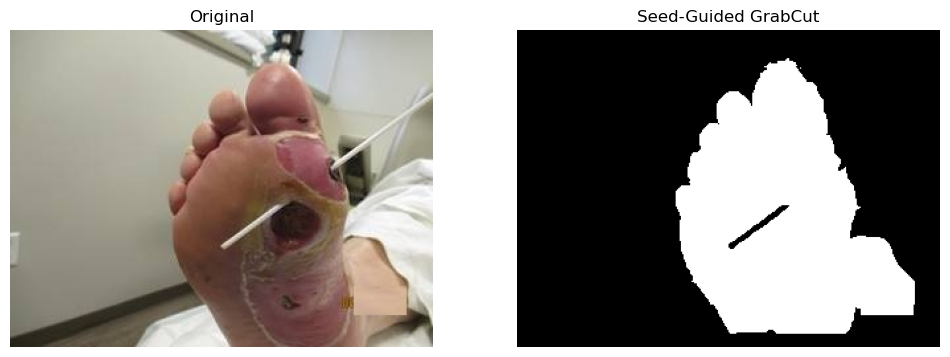

In [65]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(wound_mask, cmap="gray")
plt.title("Seed-Guided GrabCut")
plt.axis("off")

plt.show()

ROI: 147 80 283 213


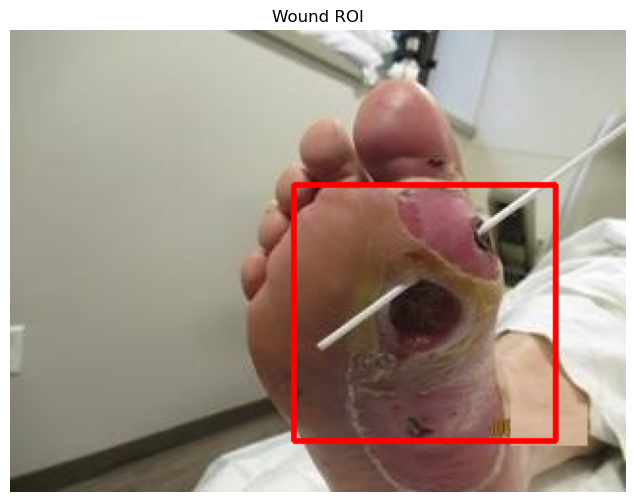

In [66]:
# Find bounding box of the clean seed
ys, xs = np.where(seed_clean > 0)

x_min, x_max = xs.min(), xs.max()
y_min, y_max = ys.min(), ys.max()

# Expand around the seed
padding = 50

x1 = max(0, x_min - padding)
y1 = max(0, y_min - padding)
x2 = min(w, x_max + padding)
y2 = min(h, y_max + padding)

print("ROI:", x1, y1, x2, y2)

# Visualize ROI
roi_image = image_rgb.copy()

cv2.rectangle(
    roi_image,
    (x1, y1),
    (x2, y2),
    (255, 0, 0),
    2
)

plt.figure(figsize=(8, 6))
plt.imshow(roi_image)
plt.title("Wound ROI")
plt.axis("off")
plt.show()

In [67]:
gc_mask = np.full((h, w), cv2.GC_BGD, dtype=np.uint8)

# Only the ROI is allowed to contain the wound
gc_mask[y1:y2, x1:x2] = cv2.GC_PR_FGD

# Definite wound seed
gc_mask[seed_clean > 0] = cv2.GC_FGD

bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

cv2.grabCut(
    image_bgr,
    gc_mask,
    None,
    bgd_model,
    fgd_model,
    5,
    cv2.GC_INIT_WITH_MASK
)

wound_mask = np.where(
    (gc_mask == cv2.GC_FGD) |
    (gc_mask == cv2.GC_PR_FGD),
    255,
    0
).astype(np.uint8)

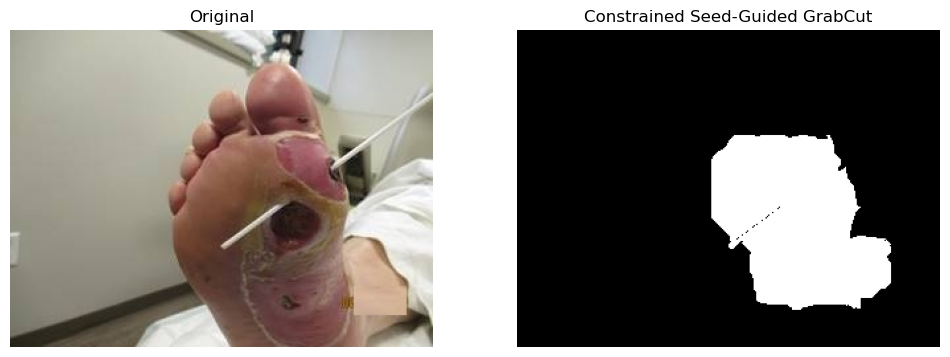

In [68]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(wound_mask, cmap="gray")
plt.title("Constrained Seed-Guided GrabCut")
plt.axis("off")

plt.show()

In [69]:
from collections import deque

# Work with LAB image
lab_float = lab.astype(np.float32)

# Starting seed pixels
seed_points = np.argwhere(seed_clean > 0)

# Mean LAB color of the definite wound seed
seed_color = lab_float[seed_clean > 0].mean(axis=0)

print("Seed LAB color:", seed_color)
print("Number of seed pixels:", len(seed_points))

Seed LAB color: [ 32.930153 137.36787  133.95926 ]
Number of seed pixels: 859


In [70]:
# Maximum LAB color distance from the seed
color_threshold = 45

region = np.zeros((h, w), dtype=np.uint8)

queue = deque()

# Add seed pixels
for y, x in seed_points:
    queue.append((y, x))
    region[y, x] = 255

# 8-connected neighbors
neighbors = [
    (-1, -1), (-1, 0), (-1, 1),
    ( 0, -1),          ( 0, 1),
    ( 1, -1), ( 1, 0), ( 1, 1)
]

while queue:
    y, x = queue.popleft()

    for dy, dx in neighbors:
        ny = y + dy
        nx = x + dx

        if ny < 0 or ny >= h or nx < 0 or nx >= w:
            continue

        # Don't leave the foot region
        if foot_mask[ny, nx] == 0:
            continue

        # Already included
        if region[ny, nx] > 0:
            continue

        # LAB distance from wound seed color
        pixel = lab_float[ny, nx]
        distance = np.linalg.norm(pixel - seed_color)

        if distance < color_threshold:
            region[ny, nx] = 255
            queue.append((ny, nx))

print("Region pixels:", np.sum(region > 0))

Region pixels: 4555


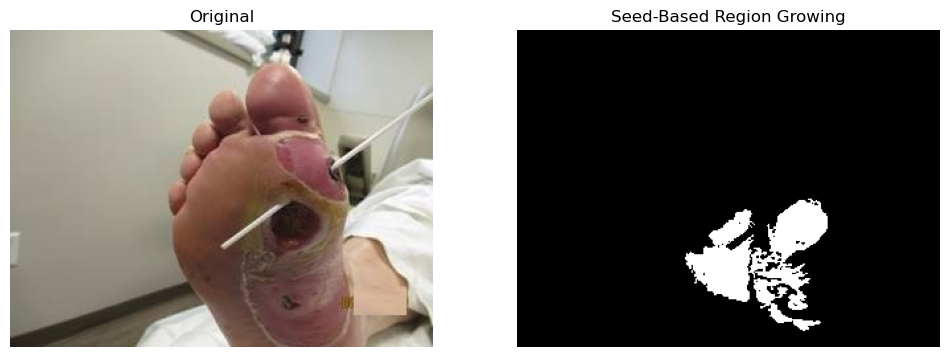

In [71]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image_rgb)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(region, cmap="gray")
plt.title("Seed-Based Region Growing")
plt.axis("off")

plt.show()

In [72]:
from pathlib import Path

model_path = Path("../models/unet_dataset2_refined.keras")

print("Model exists:", model_path.exists())
print("Model path:", model_path)

Model exists: True
Model path: ../models/unet_dataset2_refined.keras


In [73]:
import tensorflow as tf

model_path = "../models/unet_dataset2_refined.keras"

model = tf.keras.models.load_model(
    model_path,
    compile=False
)

print("Model loaded successfully!")
print("Input shape:", model.input_shape)
print("Output shape:", model.output_shape)

2026-09-05 23:25:24.581581: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2026-09-05 23:25:24.705649: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-L355
2026-09-05 23:25:24.708169: I external/local_xla/xla/stream_executor/cuda/cuda_executor.cc:901] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero. See more at https://github.com/torvalds/linux/blob/v6.0/Documentation/ABI/testing/sysfs-bus-pci#L344-

Model loaded successfully!
Input shape: (None, 256, 256, 3)
Output shape: (None, 256, 256, 1)


In [74]:
# Resize image to model input size
image_resized = cv2.resize(
    image_rgb,
    (256, 256)
)

# Normalize exactly as we did during training
image_input = image_resized.astype(np.float32) / 255.0

# Add batch dimension
image_input = np.expand_dims(
    image_input,
    axis=0
)

print("Input shape:", image_input.shape)
print("Input dtype:", image_input.dtype)
print("Value range:", image_input.min(), image_input.max())

Input shape: (1, 256, 256, 3)
Input dtype: float32
Value range: 0.023529412 1.0


In [75]:
prediction = model.predict(
    image_input,
    verbose=0
)

print("Prediction shape:", prediction.shape)
print("Prediction range:", prediction.min(), prediction.max())

2026-09-05 23:27:02.174175: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8907


Prediction shape: (1, 256, 256, 1)
Prediction range: 2.7056344e-19 0.99998283


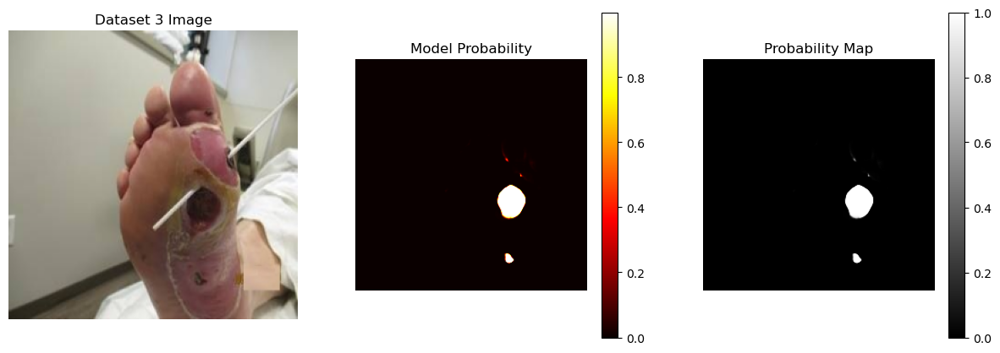

Min: 2.7056344e-19
Max: 0.99998283
Mean: 0.014254158


In [76]:
# Remove batch and channel dimensions
probability_map = prediction[0, :, :, 0]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Dataset 3 Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(probability_map, cmap="hot")
plt.title("Model Probability")
plt.colorbar()
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(probability_map, cmap="gray", vmin=0, vmax=1)
plt.title("Probability Map")
plt.colorbar()
plt.axis("off")

plt.show()

print("Min:", probability_map.min())
print("Max:", probability_map.max())
print("Mean:", probability_map.mean())

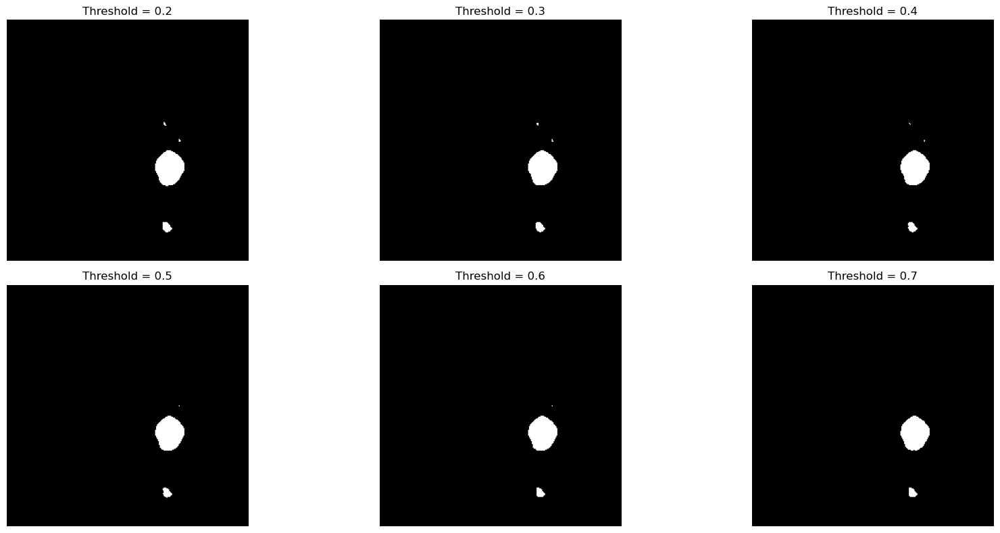

In [77]:
thresholds = [0.2, 0.3, 0.4, 0.5, 0.6, 0.7]

plt.figure(figsize=(18, 8))

for i, threshold in enumerate(thresholds):

    mask = (probability_map > threshold).astype(np.uint8)

    plt.subplot(2, 3, i + 1)
    plt.imshow(mask, cmap="gray")
    plt.title(f"Threshold = {threshold}")
    plt.axis("off")

plt.tight_layout()
plt.show()

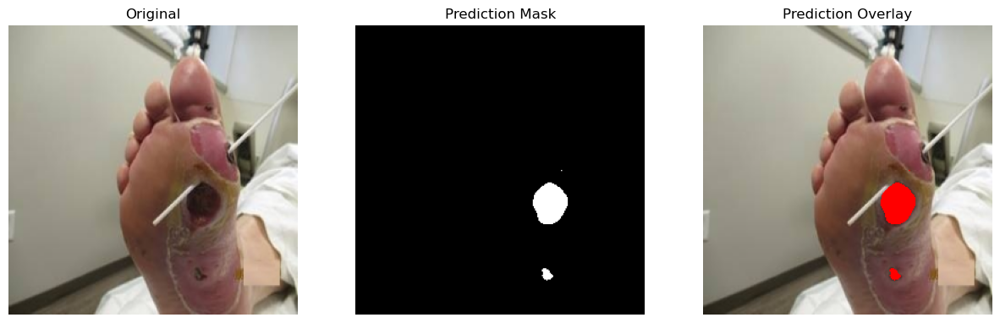

In [78]:
mask_05 = (probability_map > 0.5).astype(np.uint8)

overlay = image_resized.copy()

# Highlight predicted region
overlay[mask_05 == 1] = [255, 0, 0]

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(image_resized)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask_05, cmap="gray")
plt.title("Prediction Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(overlay)
plt.title("Prediction Overlay")
plt.axis("off")

plt.show()

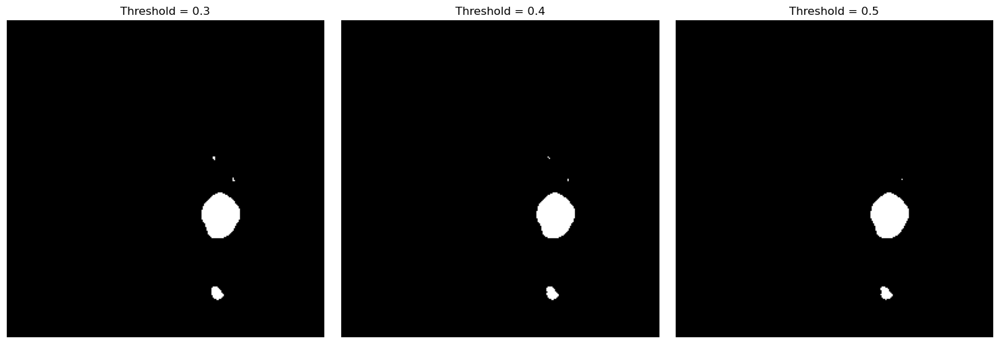

In [79]:
thresholds = [0.3, 0.4, 0.5]

plt.figure(figsize=(15, 5))

for i, threshold in enumerate(thresholds):
    mask = (probability_map > threshold).astype(np.uint8)

    plt.subplot(1, 3, i + 1)
    plt.imshow(mask, cmap="gray")
    plt.title(f"Threshold = {threshold}")
    plt.axis("off")

plt.tight_layout()
plt.show()

In [83]:
from pathlib import Path

dataset3path = Path("../dataset/woundDataset3")

image_paths = sorted(
    list(dataset3path.glob("*.jpg")) +
    list(dataset3path.glob("*.jpeg")) +
    list(dataset3path.glob("*.png"))
)

print("Total images:", len(image_paths))
print("First image:", image_paths[0])
print("Last image:", image_paths[-1])

Total images: 1000
First image: ../dataset/woundDataset3/0.jpg
Last image: ../dataset/woundDataset3/999.jpg


In [84]:
sample_paths = image_paths[:20]

print("Sample size:", len(sample_paths))

Sample size: 20


In [85]:
predictions = []

for path in sample_paths:

    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    img_resized = cv2.resize(img, (256, 256))

    img_input = img_resized.astype(np.float32) / 255.0
    img_input = np.expand_dims(img_input, axis=0)

    pred = model.predict(img_input, verbose=0)[0, :, :, 0]

    predictions.append((img_resized, pred))

print("Processed:", len(predictions), "images")

Processed: 20 images


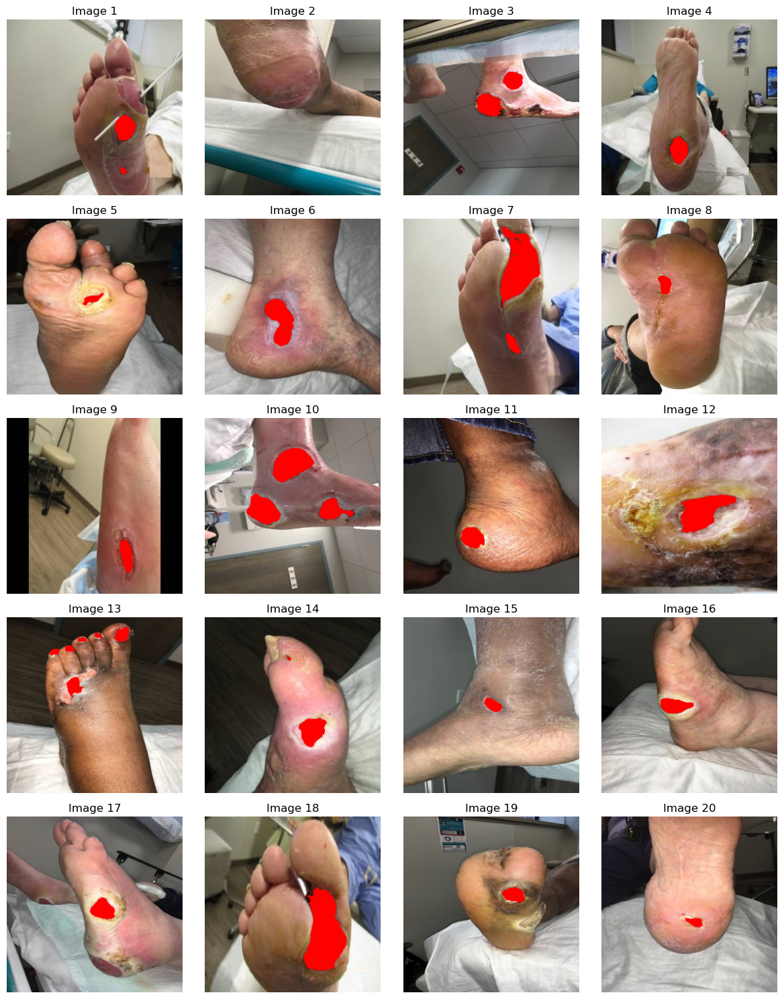

In [86]:
fig, axes = plt.subplots(5, 4, figsize=(12, 15))

for i, (img, pred) in enumerate(predictions):

    mask = pred > 0.5

    # Overlay prediction in red
    display_img = img.copy()
    display_img[mask] = [255, 0, 0]

    axes[i // 4, i % 4].imshow(display_img)
    axes[i // 4, i % 4].set_title(f"Image {i + 1}")
    axes[i // 4, i % 4].axis("off")

plt.tight_layout()
plt.show()

In [87]:
def generate_pseudo_mask(model, image_path, threshold=0.5):
    """
    Generate a pseudo-mask for one Dataset-3 image
    using the trained U-Net.
    """

    # Read image
    image = cv2.imread(str(image_path))

    if image is None:
        return None, None

    # BGR -> RGB
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    # Resize to model input
    image_resized = cv2.resize(
        image_rgb,
        (256, 256)
    )

    # Normalize
    image_input = image_resized.astype(np.float32) / 255.0

    # Add batch dimension
    image_input = np.expand_dims(
        image_input,
        axis=0
    )

    # Prediction
    prediction = model.predict(
        image_input,
        verbose=0
    )[0, :, :, 0]

    # Threshold
    mask = (prediction >= threshold).astype(np.uint8)

    return image_resized, mask

In [88]:
test_image, test_mask = generate_pseudo_mask(
    model,
    image_paths[0],
    threshold=0.5
)

print("Image shape:", test_image.shape)
print("Mask shape:", test_mask.shape)
print("Mask values:", np.unique(test_mask))

Image shape: (256, 256, 3)
Mask shape: (256, 256)
Mask values: [0 1]


In [89]:
def clean_pseudo_mask(mask):
    """
    Clean a binary pseudo-mask using morphology
    and connected-component filtering.
    """

    # Convert 0/1 -> 0/255
    mask_uint8 = (mask * 255).astype(np.uint8)

    # Remove tiny holes / smooth boundaries
    kernel = np.ones((5, 5), np.uint8)

    mask_uint8 = cv2.morphologyEx(
        mask_uint8,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    # Remove small isolated components
    num_labels, labels, stats, _ = cv2.connectedComponentsWithStats(
        mask_uint8,
        connectivity=8
    )

    cleaned = np.zeros_like(mask_uint8)

    min_area = 50

    for i in range(1, num_labels):
        area = stats[i, cv2.CC_STAT_AREA]

        if area >= min_area:
            cleaned[labels == i] = 255

    return (cleaned > 0).astype(np.uint8)

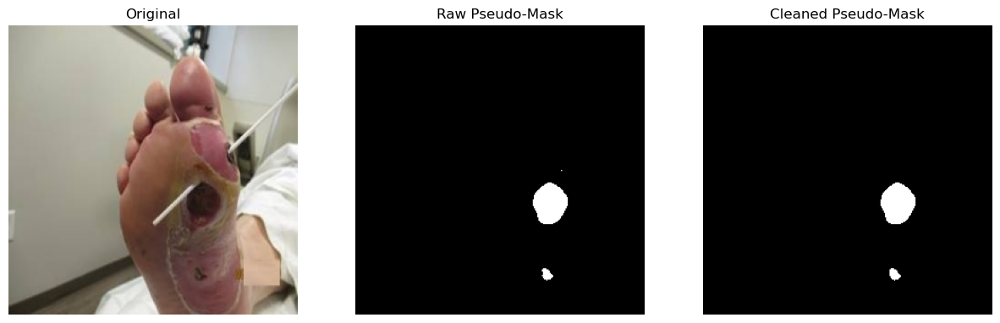

In [90]:
cleaned_mask = clean_pseudo_mask(test_mask)

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(test_image)
plt.title("Original")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(test_mask, cmap="gray")
plt.title("Raw Pseudo-Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(cleaned_mask, cmap="gray")
plt.title("Cleaned Pseudo-Mask")
plt.axis("off")

plt.show()

In [91]:
from pathlib import Path

pseudo_mask_dir = Path("../dataset/woundDataset3_pseudo_masks")

pseudo_mask_dir.mkdir(
    parents=True,
    exist_ok=True
)

print("Saving masks to:", pseudo_mask_dir)

Saving masks to: ../dataset/woundDataset3_pseudo_masks


In [92]:
import time

threshold = 0.5

start_time = time.time()

successful = 0
failed = 0

for i, path in enumerate(image_paths):

    try:
        # Generate prediction
        img = cv2.imread(str(path))

        if img is None:
            failed += 1
            continue

        img_rgb = cv2.cvtColor(
            img,
            cv2.COLOR_BGR2RGB
        )

        img_resized = cv2.resize(
            img_rgb,
            (256, 256)
        )

        img_input = (
            img_resized.astype(np.float32) / 255.0
        )

        img_input = np.expand_dims(
            img_input,
            axis=0
        )

        # U-Net prediction
        pred = model.predict(
            img_input,
            verbose=0
        )[0, :, :, 0]

        # Threshold
        mask = (
            pred >= threshold
        ).astype(np.uint8)

        # Cleanup
        mask = clean_pseudo_mask(mask)

        # Save as 0/255 PNG
        mask_to_save = (
            mask * 255
        ).astype(np.uint8)

        output_path = (
            pseudo_mask_dir / f"{path.stem}.png"
        )

        cv2.imwrite(
            str(output_path),
            mask_to_save
        )

        successful += 1

        if (i + 1) % 50 == 0:
            print(
                f"Processed {i + 1}/{len(image_paths)}"
            )

    except Exception as e:
        failed += 1
        print(f"Failed: {path.name} | {e}")

elapsed = time.time() - start_time

print("\nDone!")
print("Successful:", successful)
print("Failed:", failed)
print("Time:", round(elapsed, 2), "seconds")

Processed 50/1000
Processed 100/1000
Processed 150/1000
Processed 200/1000
Processed 250/1000
Processed 300/1000
Processed 350/1000
Processed 400/1000
Processed 450/1000
Processed 500/1000
Processed 550/1000
Processed 600/1000
Processed 650/1000
Processed 700/1000
Processed 750/1000
Processed 800/1000
Processed 850/1000
Processed 900/1000
Processed 950/1000
Processed 1000/1000

Done!
Successful: 1000
Failed: 0
Time: 63.13 seconds


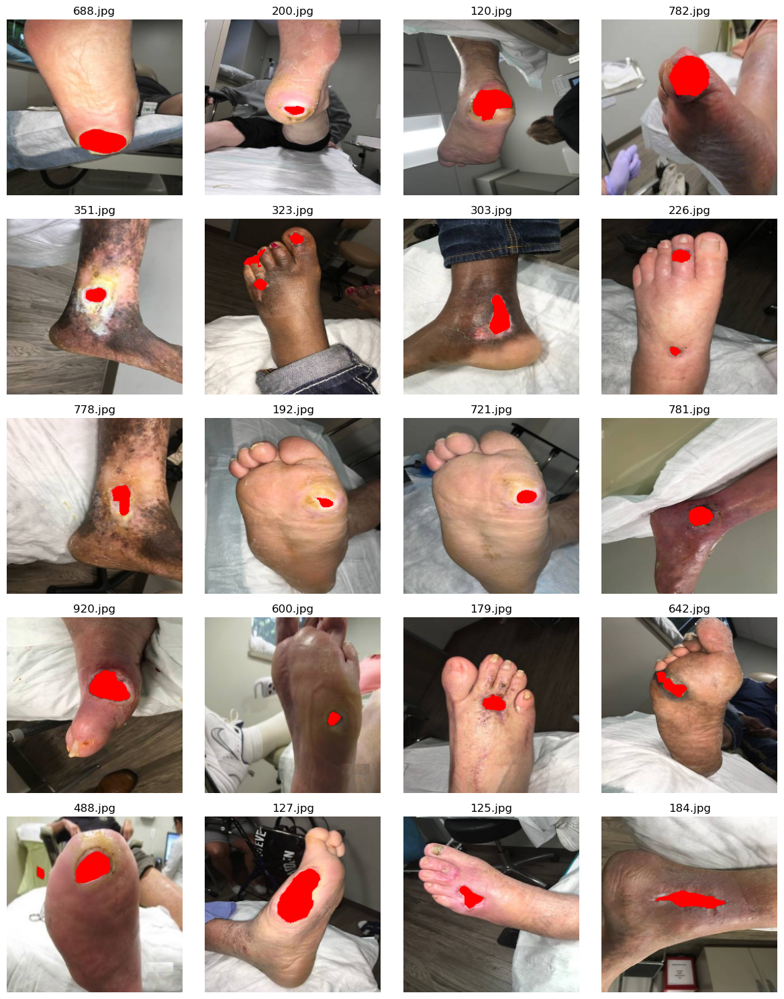

In [93]:
import random
import cv2
import matplotlib.pyplot as plt

random.seed(42)

check_paths = random.sample(image_paths, 20)

fig, axes = plt.subplots(5, 4, figsize=(12, 15))

for i, path in enumerate(check_paths):

    # Original
    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))

    # Corresponding pseudo-mask
    mask_path = pseudo_mask_dir / f"{path.stem}.png"

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    # Overlay
    overlay = img.copy()
    overlay[mask > 0] = [255, 0, 0]

    axes[i // 4, i % 4].imshow(overlay)
    axes[i // 4, i % 4].set_title(path.name)
    axes[i // 4, i % 4].axis("off")

plt.tight_layout()
plt.show()

In [94]:
mask_stats = []

for path in image_paths:

    mask_path = pseudo_mask_dir / f"{path.stem}.png"

    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    if mask is None:
        continue

    mask_pixels = np.sum(mask > 0)
    total_pixels = mask.shape[0] * mask.shape[1]

    mask_ratio = mask_pixels / total_pixels

    mask_stats.append({
        "image": path.name,
        "mask_pixels": mask_pixels,
        "mask_ratio": mask_ratio
    })

print("Images analyzed:", len(mask_stats))

Images analyzed: 1000


Minimum mask ratio: 0.0
Maximum mask ratio: 0.1937713623046875
Mean mask ratio: 0.017555618286132814
Median mask ratio: 0.011077880859375


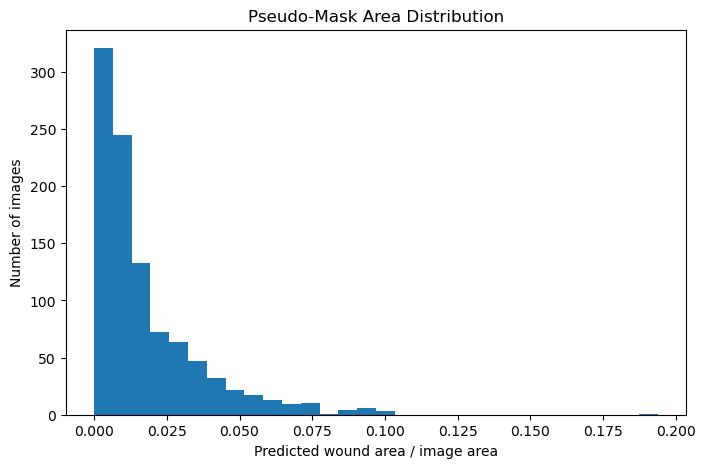

In [95]:
ratios = np.array([
    x["mask_ratio"]
    for x in mask_stats
])

print("Minimum mask ratio:", ratios.min())
print("Maximum mask ratio:", ratios.max())
print("Mean mask ratio:", ratios.mean())
print("Median mask ratio:", np.median(ratios))

plt.figure(figsize=(8, 5))

plt.hist(
    ratios,
    bins=30
)

plt.xlabel("Predicted wound area / image area")
plt.ylabel("Number of images")
plt.title("Pseudo-Mask Area Distribution")

plt.show()

In [96]:
ratios = np.array([
    x["mask_ratio"]
    for x in mask_stats
])

print("Empty masks:", np.sum(ratios == 0))
print("Very small (<0.1%):", np.sum(ratios < 0.001))
print("Small (<0.5%):", np.sum(ratios < 0.005))
print("Large (>10%):", np.sum(ratios > 0.10))
print("Very large (>20%):", np.sum(ratios > 0.20))

Empty masks: 21
Very small (<0.1%): 27
Small (<0.5%): 268
Large (>10%): 4
Very large (>20%): 0


In [97]:
sorted_stats = sorted(
    mask_stats,
    key=lambda x: x["mask_ratio"],
    reverse=True
)

print("Largest predicted masks:")

for item in sorted_stats[:20]:
    print(
        item["image"],
        f"{item['mask_ratio'] * 100:.2f}%"
    )

Largest predicted masks:
728.jpg 19.38%
6.jpg 10.13%
700.jpg 10.03%
237.jpg 10.02%
976.jpg 9.60%
730.jpg 9.55%
411.jpg 9.38%
795.jpg 9.13%
28.jpg 9.08%
487.jpg 9.06%
63.jpg 9.04%
216.jpg 8.83%
955.jpg 8.82%
595.jpg 8.55%
310.jpg 7.80%
231.jpg 7.74%
970.jpg 7.63%
113.jpg 7.50%
392.jpg 7.33%
257.jpg 7.29%


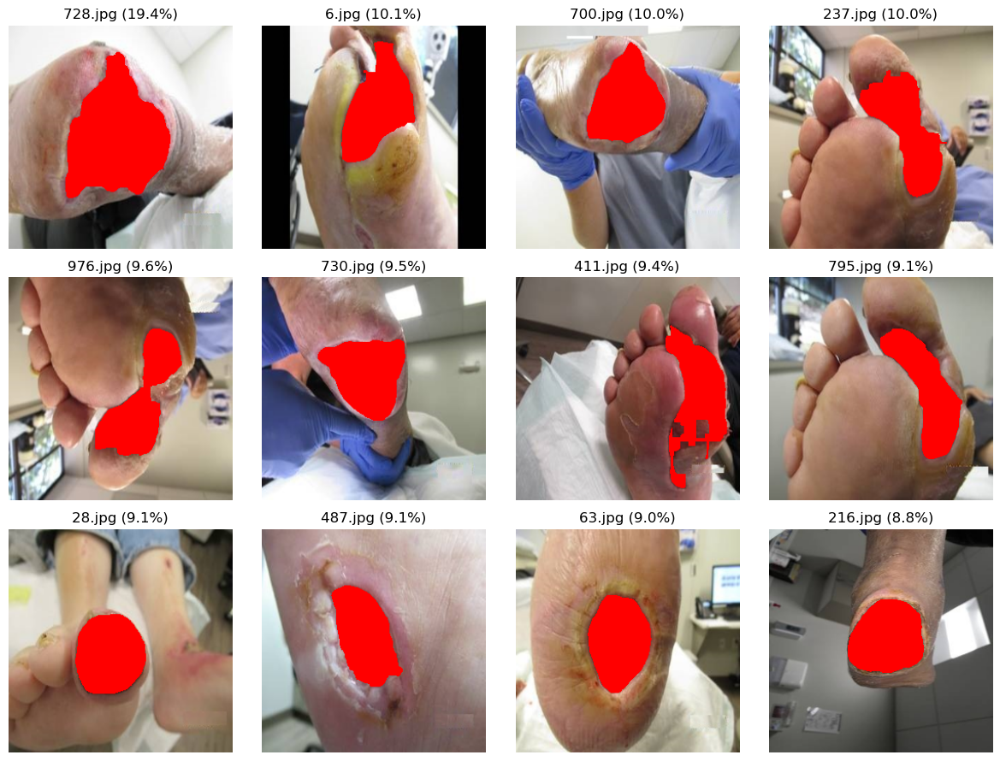

In [98]:
largest_paths = [
    image_paths[
        next(
            i for i, p in enumerate(image_paths)
            if p.name == item["image"]
        )
    ]
    for item in sorted_stats[:12]
]

fig, axes = plt.subplots(3, 4, figsize=(12, 9))

for i, path in enumerate(largest_paths):

    img = cv2.imread(str(path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = cv2.resize(img, (256, 256))

    mask_path = pseudo_mask_dir / f"{path.stem}.png"
    mask = cv2.imread(
        str(mask_path),
        cv2.IMREAD_GRAYSCALE
    )

    overlay = img.copy()
    overlay[mask > 0] = [255, 0, 0]

    axes[i // 4, i % 4].imshow(overlay)
    axes[i // 4, i % 4].set_title(
        f"{path.name} ({sorted_stats[i]['mask_ratio']*100:.1f}%)"
    )
    axes[i // 4, i % 4].axis("off")

plt.tight_layout()
plt.show()

In [ ]:
from pathlib import Path

dataset3_images = Path("../dataset/woundDataset3")
dataset3_masks = Path("../dataset/woundDataset3_pseudo_masks")

image_files = sorted(
    list(dataset3_images.glob("*.jpg")) +
    list(dataset3_images.glob("*.jpeg")) +
    list(dataset3_images.glob("*.png"))
)

mask_files = sorted(dataset3_masks.glob("*.png"))

print("Images:", len(image_files))
print("Pseudo-masks:", len(mask_files))

# Check matching filenames
image_stems = {p.stem for p in image_files}
mask_stems = {p.stem for p in mask_files}

print("Images without masks:", len(image_stems - mask_stems))
print("Masks without images:", len(mask_stems - image_stems))

Images: 1000
Pseudo-masks: 1000
Images without masks: 0
Masks without images: 0


: 